first let's visualize the data

Missing TARGETVAR before interpolation: 0
Missing TARGETVAR after interpolation: 0
Data prepared. Total samples: 43800
Final target column name: TARGETVAR


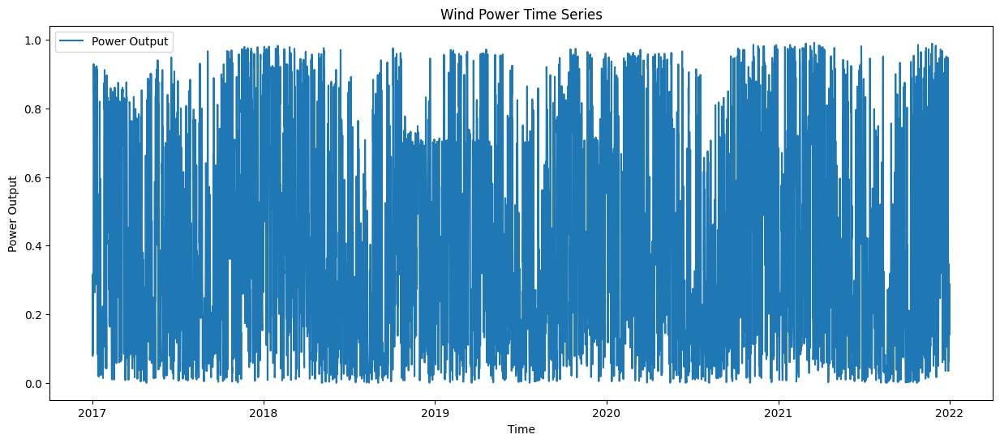

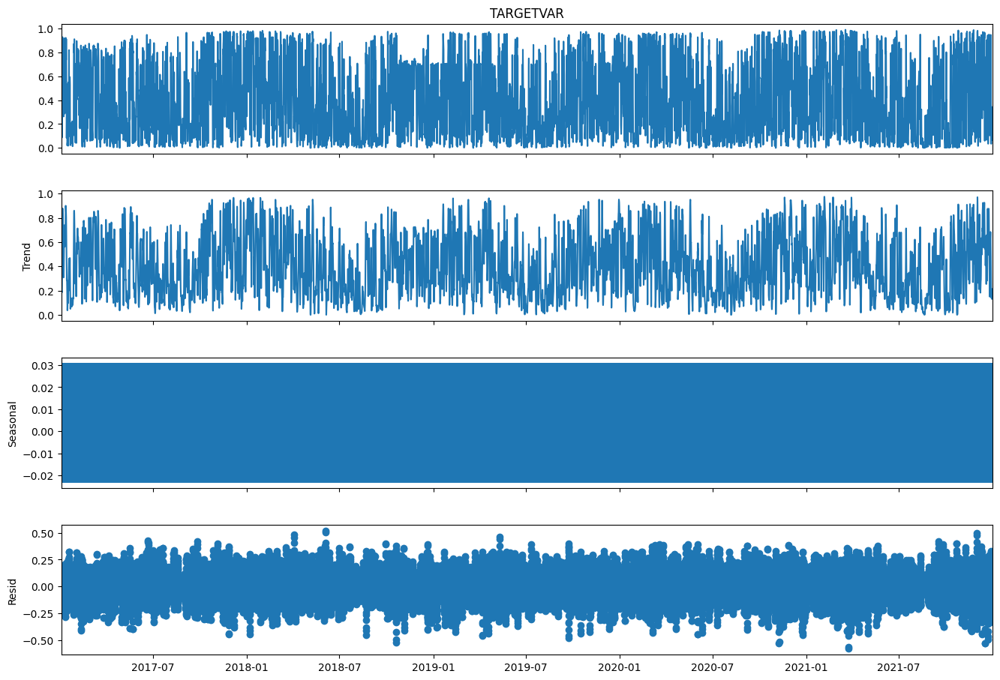

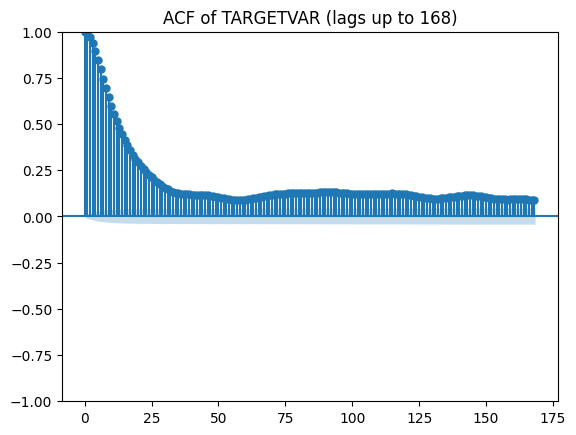

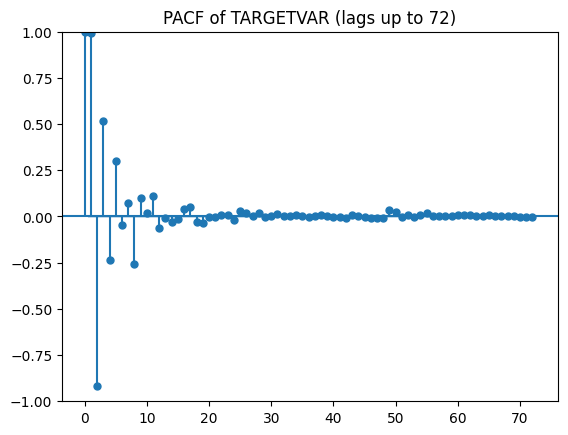

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# The statsmodels library is used for time series analysis and diagnostics
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.statespace.sarimax import SARIMAX
from scipy.signal import find_peaks
import warnings
warnings.filterwarnings("ignore")

# Configuration
CSV_PATH   =  "Location1.csv"      # Your path to the CSV file

# Load and Prepare Data
df = pd.read_csv(CSV_PATH)

# 'Time' is the datetime column; 'Power' is the target
DATETIME_COL = 'Time'
TARGET_COL = 'Power'

df[DATETIME_COL] = pd.to_datetime(df[DATETIME_COL], errors='coerce')
df = df.dropna(subset=[DATETIME_COL]).sort_values(DATETIME_COL).set_index(DATETIME_COL)

# Rename Power for consistency and ensure frequency
df = df.rename(columns={TARGET_COL:'TARGETVAR'})

# Ensure regular hourly frequency
if df.index.inferred_freq is None:
    df = df.asfreq('H')

# Interpolate Target and Exogenous NaNs
exog_cols = [c for c in df.columns if c != 'TARGETVAR']
print(f"Missing TARGETVAR before interpolation: {df['TARGETVAR'].isna().sum()}")
df['TARGETVAR'] = df['TARGETVAR'].interpolate(method='time')
print(f"Missing TARGETVAR after interpolation: {df['TARGETVAR'].isna().sum()}")
# Interpolate exogenous features
df[exog_cols] = df[exog_cols].interpolate(method='time').ffill().bfill()

# Create a numeric-only DataFrame for the correlation analysis to pass clean data forward
num_df = df.select_dtypes(include=[np.number]).copy()
TARGET_COL_FINAL = 'TARGETVAR'

print(f"Data prepared. Total samples: {len(df)}")
print(f"Final target column name: {TARGET_COL_FINAL}")

# Ploting and Decomposition
plt.figure(figsize=(15,6))
plt.plot(df.index, df[TARGET_COL_FINAL], label='Power Output')
plt.title("Wind Power Time Series")
plt.xlabel("Time")
plt.ylabel("Power Output")
plt.legend()
plt.show()

decomp = seasonal_decompose(df[TARGET_COL_FINAL], model='additive', period=s)
fig = decomp.plot()
fig.set_size_inches(15,10)
plt.show()

# ACF plot hints at AR and MA terms (p, q)
plot_acf(df[TARGET_COL_FINAL].dropna(), lags=7*s)
plt.title(f"ACF of TARGETVAR (lags up to {7*s})")
plt.show()

# PACF plot hints at AR terms (p)
plot_pacf(df[TARGET_COL_FINAL].dropna(), lags=3*s)
plt.title(f"PACF of TARGETVAR (lags up to {3*s})")
plt.show()

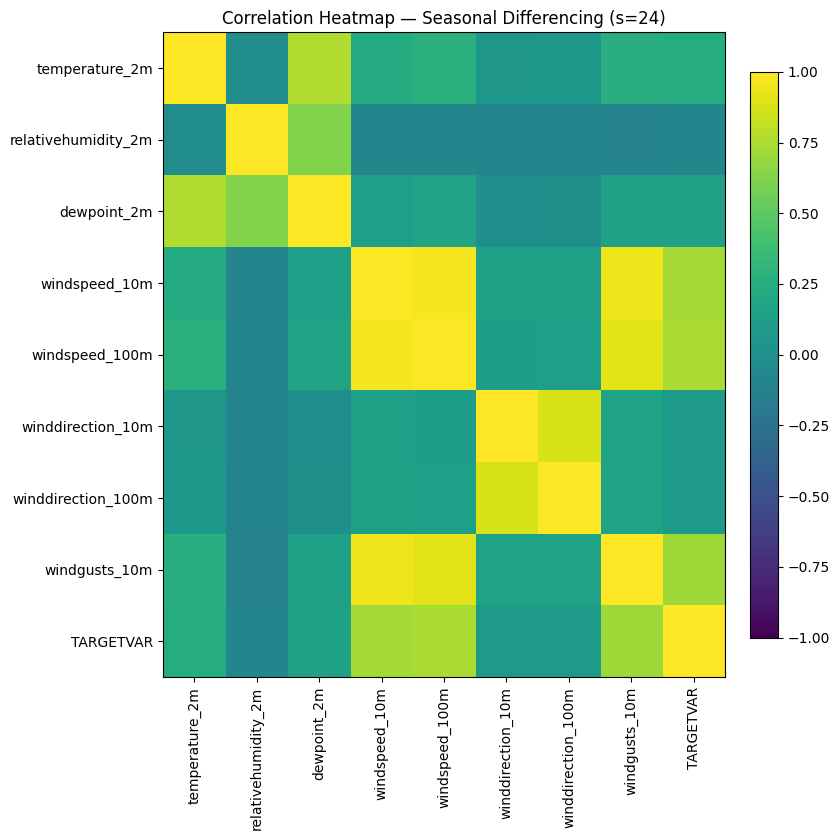


Top correlations with target (seasonal diff):
windspeed_100m         0.745
windspeed_10m          0.729
windgusts_10m          0.715
temperature_2m         0.235
dewpoint_2m            0.143
winddirection_100m     0.092
winddirection_10m      0.088
relativehumidity_2m    0.084
Name: TARGETVAR, dtype: float64


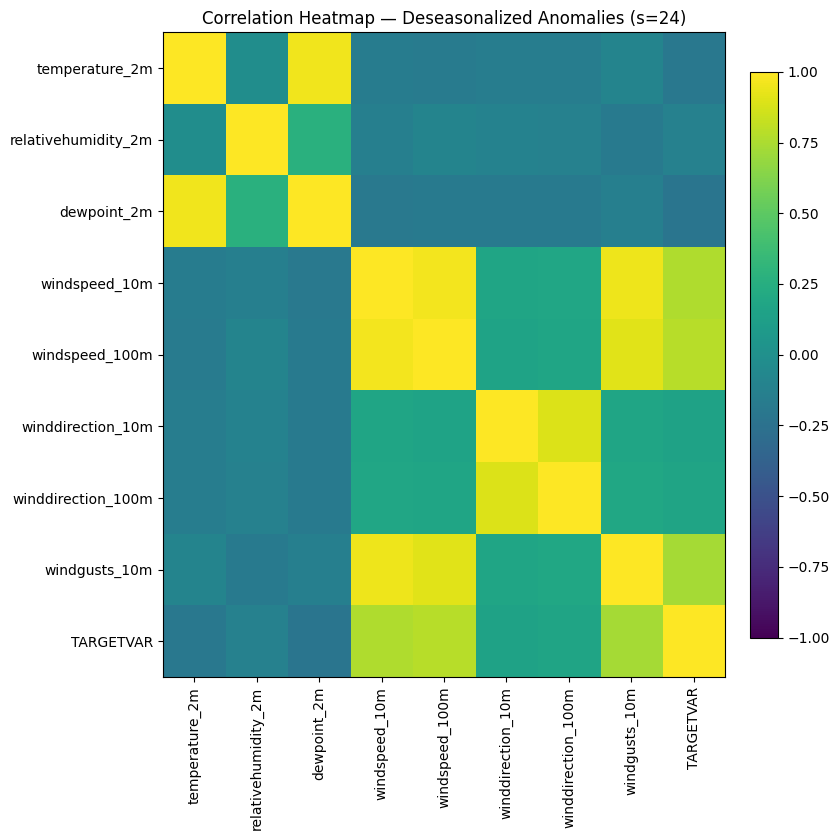


Top correlations with target (deseasonalized anomalies):
windspeed_100m         0.782
windspeed_10m          0.758
windgusts_10m          0.734
dewpoint_2m            0.224
temperature_2m         0.202
winddirection_100m     0.168
winddirection_10m      0.154
relativehumidity_2m    0.121
Name: TARGETVAR, dtype: float64


In [6]:
# Use the seasonal period determined from the decomposition (s=24)
SEASONAL_PERIOD = 24
# The target column must match the name used in Cell 1's num_df
TARGET_COL_FINAL = 'TARGETVAR' 

# Seasonal-differenced correlations: x_t - x_{t-s} 
sdiff = num_df - num_df.shift(SEASONAL_PERIOD)
sdiff = sdiff.replace([np.inf, -np.inf], np.nan).dropna()

corr_sdiff = sdiff.corr(method='pearson')

# Heatmap for Seasonal Differencing
fig_size = min(0.5 * len(corr_sdiff.columns) + 4, 18)
plt.figure(figsize=(fig_size, fig_size))
im = plt.imshow(corr_sdiff.values, aspect='auto', vmin=-1, vmax=1)
plt.colorbar(im, fraction=0.046, pad=0.04)
plt.xticks(range(len(corr_sdiff.columns)), corr_sdiff.columns, rotation=90)
plt.yticks(range(len(corr_sdiff.index)), corr_sdiff.index)
plt.title(f"Correlation Heatmap — Seasonal Differencing (s={SEASONAL_PERIOD})")
plt.tight_layout()
plt.show()

# Show top absolute correlations with target
top_sdiff = corr_sdiff[TARGET_COL_FINAL].drop(TARGET_COL_FINAL, errors='ignore').abs().sort_values(ascending=False)
print("\nTop correlations with target (seasonal diff):")
print(top_sdiff.head(15).round(3))

# Deseasonalized anomalies: subtract per-phase mean (phase = t mod s)
phase = pd.Series(np.arange(len(num_df)) % SEASONAL_PERIOD, index=num_df.index, name='phase')
anoms = num_df - num_df.groupby(phase).transform('mean')
anoms = anoms.replace([np.inf, -np.inf], np.nan).dropna()

corr_anom = anoms.corr(method='pearson')

# Heatmap for Deseasonalized Anomalies
fig_size = min(0.5 * len(corr_anom.columns) + 4, 18)
plt.figure(figsize=(fig_size, fig_size))
im = plt.imshow(corr_anom.values, aspect='auto', vmin=-1, vmax=1)
plt.colorbar(im, fraction=0.046, pad=0.04)
plt.xticks(range(len(corr_anom.columns)), corr_anom.columns, rotation=90)
plt.yticks(range(len(corr_anom.index)), corr_anom.index)
plt.title(f"Correlation Heatmap — Deseasonalized Anomalies (s={SEASONAL_PERIOD})")
plt.tight_layout()
plt.show()

# Show top absolute correlations with target
top_anom = corr_anom[TARGET_COL_FINAL].drop(TARGET_COL_FINAL, errors='ignore').abs().sort_values(ascending=False)
print("\nTop correlations with target (deseasonalized anomalies):")
print(top_anom.head(15).round(3))

In [7]:
# Perform seasonal decomposition
decomposition = seasonal_decompose(df['TARGETVAR'], model='additive', period=365*24)
# period = seasonal period

# Plot the decomposed components
fig = decomposition.plot()
fig.set_size_inches(120, 70)
plt.show()

Top spectral peaks:
f = 0.00011 cycles/hour | period =  8760.00 hours | power = 98.6
f = 0.00023 cycles/hour | period =  4380.00 hours | power = 19.1
f = 0.00091 cycles/hour | period =  1095.00 hours | power = 10.2
f = 0.00374 cycles/hour | period =   267.07 hours | power = 9.75
f = 0.00941 cycles/hour | period =   106.31 hours | power = 8.74
f = 0.00272 cycles/hour | period =   368.07 hours | power = 8.28
f = 0.00228 cycles/hour | period =   438.00 hours | power = 8.06
f = 0.01053 cycles/hour | period =    95.01 hours | power = 8.03
f = 0.00064 cycles/hour | period =  1564.29 hours | power = 7.94
f = 0.00534 cycles/hour | period =   187.18 hours | power = 7.91


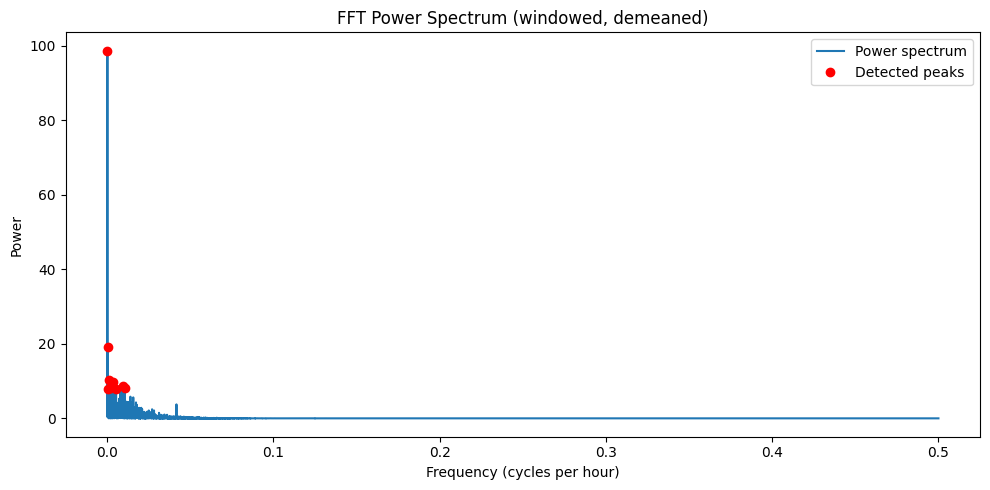

In [ ]:
#FFt code for seasonality analysis (fixed)

# Preparation
y = df['TARGETVAR'].astype(float).interpolate('time').dropna()

# Sampling interval (hours).
if isinstance(y.index, pd.DatetimeIndex) and len(y.index) > 1:
    dt_hours = y.index.to_series().diff().dropna().dt.total_seconds().median() / 3600.0
    if not np.isfinite(dt_hours) or dt_hours <= 0:
        dt_hours = 1.0
else:
    dt_hours = 1.0  # fallback: 1 unit per sample

x = y.values
N = x.size
x = x - x.mean()                 # remove DC
window = np.hanning(N)           # taper to reduce leakage
xw = x * window

# Real FFT and power spectrum
fft = np.fft.rfft(xw)
freqs = np.fft.rfftfreq(N, d=dt_hours)  # cycles per hour when dt_hours=1
power = (np.abs(fft) ** 2) / (window**2).sum()  # normalized power

# Peak detection (ignore DC, use prominence ~5% of max)
valid = freqs > 0
freqs_v = freqs[valid]
power_v = power[valid]
prom = power_v.max() * 0.05
peaks, props = find_peaks(power_v, prominence=prom)

peak_freqs = freqs_v[peaks]
peak_powers = power_v[peaks]
peak_period_hours = 1.0 / peak_freqs

# Sort peaks by power (descending)
order = np.argsort(peak_powers)[::-1]
peak_freqs = peak_freqs[order]
peak_powers = peak_powers[order]
peak_period_hours = peak_period_hours[order]

# Print top peaks
print("Top spectral peaks:")
for f, pwr, per in zip(peak_freqs[:10], peak_powers[:10], peak_period_hours[:10]):
    print(f"f = {f:.5f} cycles/hour | period = {per:8.2f} hours | power = {pwr:.3g}")

# Plot spectrum with peaks
plt.figure(figsize=(10,5))
plt.plot(freqs_v, power_v, label="Power spectrum")
plt.plot(peak_freqs[:10], peak_powers[:10], "ro", label="Detected peaks")
plt.xlabel("Frequency (cycles per hour)")
plt.ylabel("Power")
plt.title("FFT Power Spectrum (windowed, demeaned)")
plt.legend()
plt.tight_layout()
plt.show()


Try to find seasonality in mid-year wise

Viewing window: 2017-06-01 00:00:00 → 2018-06-01 00:00:00  (rows=8760)


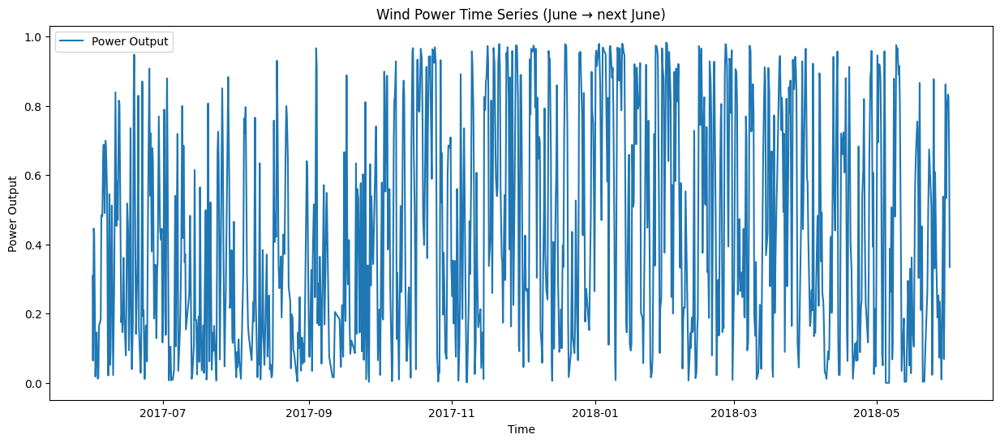

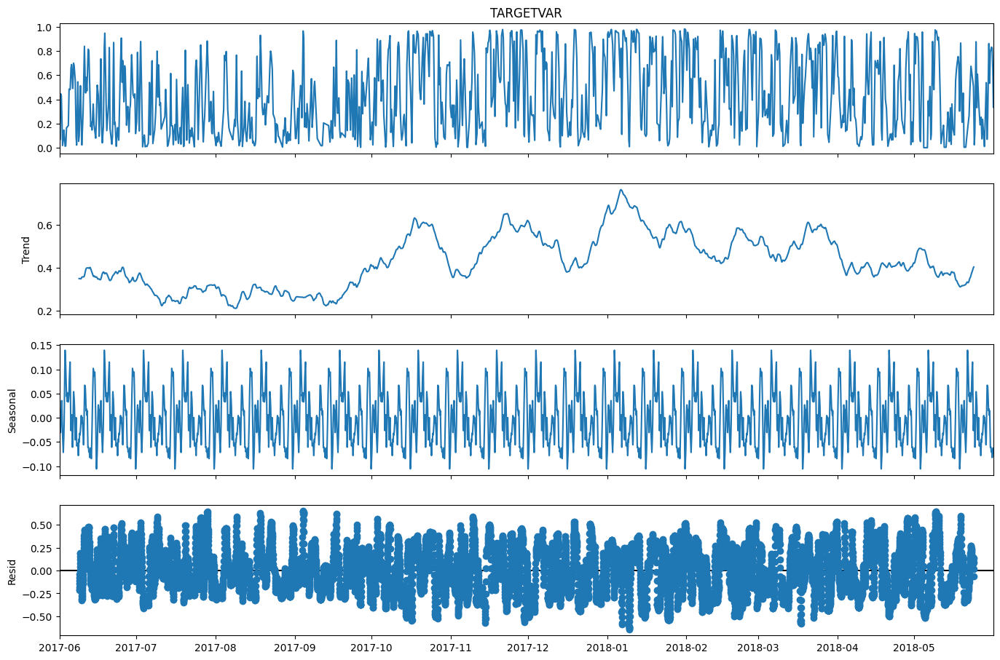

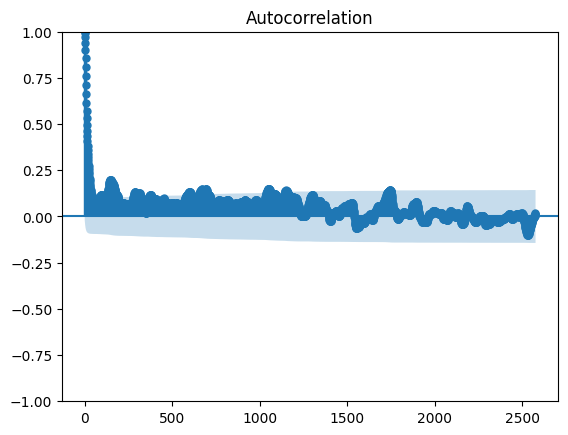

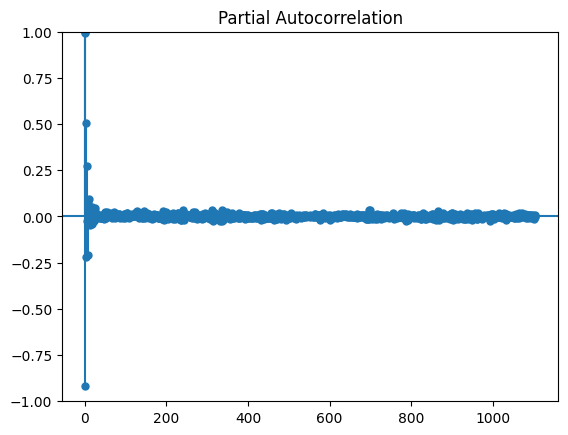

In [9]:
# -> Restrict to June → next June window (middle-of-year seasonality) 
# Finds the first June on/after the dataset start; window is [start_june, next_june)
first_ts   = df.index.min()
first_year = first_ts.year

first_june = pd.Timestamp(first_year, 6, 1)
start_june = first_june if first_ts <= first_june else pd.Timestamp(first_year + 1, 6, 1)
next_june  = start_june + pd.DateOffset(years=1)

# Clip to data bounds and make end exclusive
start = max(start_june, df.index.min())
end   = min(next_june,  df.index.max())

df_view = df[(df.index >= start) & (df.index < end)].copy()
print(f"Viewing window: {start} → {end}  (rows={len(df_view)})")

# --- Visuals on the June→June slice (use df_view instead of df) ---
plt.figure(figsize=(15,6))
plt.plot(df_view.index, df_view['TARGETVAR'], label='Power Output')
plt.title("Wind Power Time Series (June → next June)")
plt.xlabel("Time")
plt.ylabel("Power Output")
plt.legend(); plt.show()

# Seasonal decomposition
n_obs = df_view['TARGETVAR'].dropna().shape[0]
s = 368
# 's' is your seasonal period (e.g., s=24 for hourly daily cycle)
if n_obs >= 2 * s:
    decomp = seasonal_decompose(df_view['TARGETVAR'], model='additive', period=s)
    fig = decomp.plot(); fig.set_size_inches(15,10); plt.show()
else:
    print(f"Not enough data for seasonal_decompose (need ≥ {2*s} points, have {n_obs}).")

lags_acf  = int(min(7*s, max(1, n_obs - 2)))
lags_pacf = int(min(3*s, max(1, n_obs - 2)))
plot_acf(df_view['TARGETVAR'].dropna(), lags=lags_acf);  plt.show()
plot_pacf(df_view['TARGETVAR'].dropna(), lags=lags_pacf); plt.show()


Train and Parameter findings from train data

In [ ]:
# Train/test split
split_point = int(len(df) * 0.8)
endog = df['TARGETVAR']
exog = df[exog_cols]

train_endog, test_endog = endog.iloc[:split_point], endog.iloc[split_point:]
train_exog,  test_exog  = exog.iloc[:split_point],  exog.iloc[split_point:]

print("\nData Split:")
print(f"Training: {len(train_endog)} | Testing: {len(test_endog)}")

# Parameters finding
from pmdarima import auto_arima
model = auto_arima(train_endog, exogenous=train_exog, m=12, trace=True, error_action='ignore', suppress_warnings=True)
print(model.summary())


Performing stepwise search to minimize aic


KeyboardInterrupt: 

Building the model

In [ ]:
# SARIMAX model 

order = (1, 1, 2)
seasonal_order = (0, 2, 1, 24)  # <- 24; align with hourly seasonality

model = SARIMAX(
    train_endog,
    exog=train_exog,
    order=order,
    seasonal_order=seasonal_order,
    enforce_stationarity=False,
    enforce_invertibility=False,
)
results = model.fit(disp=False)
print(results.summary())
results.plot_diagnostics(figsize=(15, 12)); plt.show()

# Forecast
fcst = results.get_forecast(steps=len(test_endog), exog=test_exog)
yhat = fcst.predicted_mean
ci = fcst.conf_int()

plt.figure(figsize=(15,6))
plt.plot(train_endog.index, train_endog, label='Train')
plt.plot(test_endog.index, test_endog, label='Test', color='orange')
plt.plot(yhat.index, yhat, label='Forecast', color='green')
plt.fill_between(ci.index, ci.iloc[:,0], ci.iloc[:,1], alpha=0.1, label='95% CI')
plt.title('SARIMAX Forecast vs Actual')
plt.xlabel('Time'); plt.ylabel('Power Output'); plt.legend(); plt.show()



Data Split:
Training: 35040 | Testing: 8760


KeyboardInterrupt: 

Let's check for the errors and accuracy

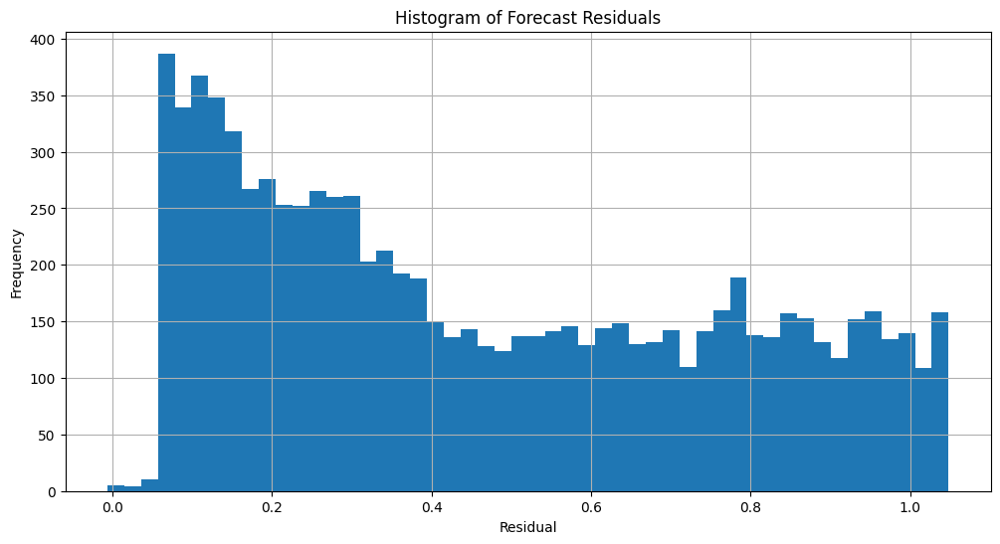


--- Model Evaluation ---
MAE : 0.4624
MSE : 0.3033
RMSE: 0.5508
R^2 : -2.3940

--- Residuals Summary ---
count    8760.000000
mean        0.462437
std         0.299165
min        -0.006372
25%         0.194581
50%         0.391403
75%         0.729613
max         1.048219
dtype: float64


In [ ]:
actual = test_endog.dropna()
pred   = yhat.reindex(actual.index)

mae = mean_absolute_error(actual, pred)
mse = mean_squared_error(actual, pred)
rmse = np.sqrt(mse)
r2 = r2_score(actual, pred)

resid = actual - pred
plt.figure(figsize=(12,6))
plt.hist(resid, bins=50)
plt.title('Histogram of Forecast Residuals'); plt.xlabel('Residual'); plt.ylabel('Frequency'); plt.grid(True); plt.show()

print("\n--- Model Evaluation ---")
print(f"MAE : {mae:.4f}")
print(f"MSE : {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R^2 : {r2:.4f}")
print("\n--- Residuals Summary ---")
print(resid.describe())


--------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------